## Event Detection 

In [1]:
import pandas as pd
import sys
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go
sys.path.append('../../')

from scoring.event_detection_matrix import competition_score
from tqdm import tqdm

## Daten laden

In [2]:
predictions = pd.read_parquet('./test/predicted_series.parquet')
validation_events = pd.read_csv('../../data/processed/validation_events_split.csv')

In [3]:
validation_events = validation_events[validation_events.step.notnull()]
validation_events

,series_id,night,event,step,timestamp,num_series_id
0,062dbd4c95e6,1,onset,7872.0,2018-08-22T23:11:00-0400,7
1,062dbd4c95e6,1,wakeup,14484.0,2018-08-23T08:22:00-0400,7
6,062dbd4c95e6,4,onset,60720.0,2018-08-26T00:35:00-0400,7
7,062dbd4c95e6,4,wakeup,68400.0,2018-08-26T11:15:00-0400,7
8,062dbd4c95e6,5,onset,77304.0,2018-08-26T23:37:00-0400,7
...,...,...,...,...,...,...
2955,fcca183903b7,33,wakeup,565824.0,2019-04-28T06:52:00-0400,276
2956,fcca183903b7,34,onset,577344.0,2019-04-28T22:52:00-0400,276
2957,fcca183903b7,34,wakeup,584052.0,2019-04-29T08:11:00-0400,276
2958,fcca183903b7,35,onset,595344.0,2019-04-29T23:52:00-0400,276


In [4]:
predictions['series_id'] = predictions['num_series_id'].astype(str)

In [5]:
predictions['correct_prediction'] = (predictions['awake'] == predictions['prediction_class']).replace({True: 1, False: 0})

## Extract Events

In [6]:
def get_events_smoothed(test_series) :
    series_ids = test_series['num_series_id'].unique()
    events = []

    for idx in tqdm(series_ids):
        # Collecting sample and normalizing features
        X = test_series[test_series.num_series_id == idx]
                
        smoothing_length = 12 * 60 # 30 Minutes
        # We average the confidence, that the participant is awake
        X["confidence_awake"] = X["prediction_confidence_1"].rolling(smoothing_length, center=True).mean().bfill().ffill()
        X["asleep"] = X["prediction_confidence_0"].rolling(smoothing_length, center=True).mean().bfill().ffill()

        # Binarize the asleep column
        X["asleep"] = X["asleep"].round()

        # Getting predicted onset and wakeup time steps
        pred_onsets = X[X['asleep'].diff() > 0]['step'].tolist() # diff is > 0 if it changes from 0 (awake) to 1 (asleep)
        pred_wakeups = X[X['asleep'].diff() < 0]['step'].tolist() # diff is < 0 if it changes from 1 (asleep) to 0 (awake)
     
        if len(pred_onsets) > 0:

            # Ensuring all predicted sleep periods begin and end
            if min(pred_wakeups) < min(pred_onsets):
                pred_wakeups = pred_wakeups[1:]

            if max(pred_onsets) > max(pred_wakeups):
                pred_onsets = pred_onsets[:-1]

            # Keeping sleep periods longer than 30 minutes
            sleep_periods = [(onset, wakeup) for onset, wakeup in zip(pred_onsets, pred_wakeups) if wakeup - onset >= 12 * 30]

            for onset, wakeup in sleep_periods:
                # We take the score
                score = 1 - X[(X['step'] >= onset) & (X['step'] < wakeup)]['confidence_awake'].mean()

                # Adding sleep event to dataframe
                onset_row = {'row_id': len(events), 'series_id': idx, 'step': onset, 'event': 'onset', 'score': score}                
                events.append(onset_row)

                wakeup_row = {'row_id': len(events), 'series_id': idx, 'step': wakeup, 'event': 'wakeup', 'score': score}
                events.append(wakeup_row)

    return pd.DataFrame(events)

In [7]:
predicted_events = get_events_smoothed(predictions)

  0%|          | 0/54 [00:00<?, ?it/s]/tmp/ipykernel_1437/2624563889.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["confidence_awake"] = X["prediction_confidence_1"].rolling(smoothing_length, center=True).mean().bfill().ffill()
/tmp/ipykernel_1437/2624563889.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["asleep"] = X["prediction_confidence_0"].rolling(smoothing_length, center=True).mean().bfill().ffill()
/tmp/ipykernel_1437/2624563889.py:15: SettingWithCopyWarning: 
A value is trying to be

 91%|██████████████████████████████████████████████████████████████████████████▍       | 49/54 [00:04<00:00, 13.77it/s]C:\Users\timon\AppData\Local\Temp\ipykernel_9600\2624563889.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["confidence_awake"] = X["prediction_confidence_1"].rolling(smoothing_length, center=True).mean().bfill().ffill()
C:\Users\timon\AppData\Local\Temp\ipykernel_9600\2624563889.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["asleep"] = X["prediction_confidence_0"].rolling(s

In [8]:
validation_events['series_id'] = validation_events['num_series_id']

In [9]:
competition_score(validation_events, predicted_events)

0.4739971196968508

## Daten visualisieren

In [10]:
sample = predictions[predictions.num_series_id == 7]

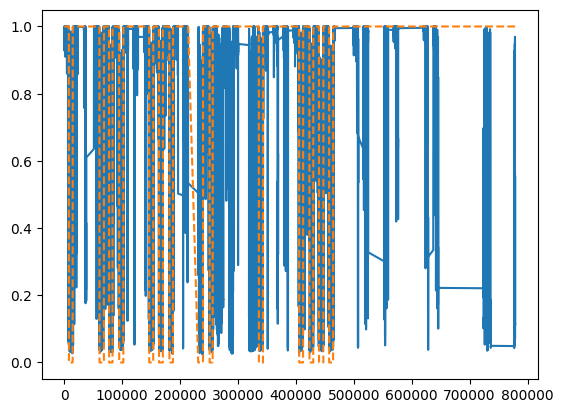

In [11]:
plt.plot(sample['step'], sample['prediction_confidence_1'])
plt.plot(sample['step'], sample['awake'], linestyle='dashed')
plt.show()

## Accuracy pro Serie

In [12]:
series = predictions.series_id.unique()

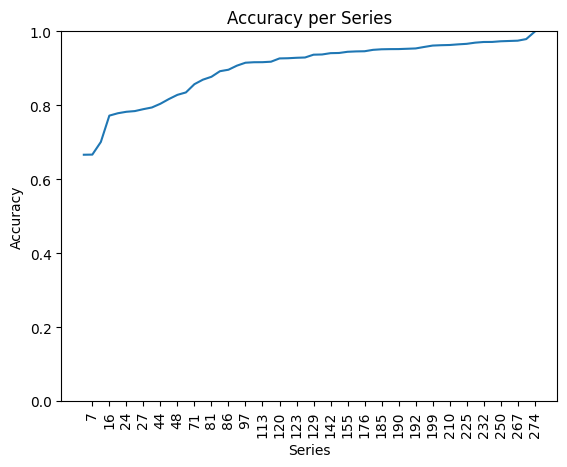

In [13]:
ax = predictions.groupby('series_id')['correct_prediction'].mean().sort_values().plot(
    ylim=(0, 1), title='Accuracy per Series'
)
ax.set_ylabel("Accuracy")
ax.set_xlabel("Series")
ax.set_xticks(ticks=[*range(1, len(series), 2)], labels=series[::2], rotation=90)

fig = ax.get_figure()
fig.savefig("accuracy-per-series.png", bbox_inches="tight")

In [14]:
predictions.groupby('series_id')['correct_prediction'].mean().sort_values()

series_id
179    0.666561
187    0.666918
26     0.701083
71     0.772358
250    0.778817
196    0.782768
122    0.784692
171    0.789879
86     0.794418
217    0.804507
24     0.817231
27     0.828586
10     0.835156
83     0.857475
7      0.869698
267    0.877484
191    0.892564
44     0.896568
210    0.907642
204    0.915534
232    0.916845
192    0.916976
270    0.918271
124    0.927140
120    0.927666
190    0.928877
131    0.929662
248    0.937250
113    0.937819
63     0.941389
48     0.941885
185    0.945107
81     0.946121
142    0.946557
16     0.950378
176    0.951882
129    0.952306
123    0.952441
32     0.953271
199    0.954148
274    0.958142
97     0.961931
155    0.962903
117    0.963477
108    0.965205
251    0.966610
148    0.969808
72     0.971606
276    0.971766
225    0.973558
21     0.974350
47     0.975137
228    0.979479
94     0.999537
Name: correct_prediction, dtype: float64

## Competition Score pro Serie

In [15]:
series_ids = validation_events.series_id.unique()
scores = []

for series_id in tqdm(series_ids):
    predicted_events_series = predicted_events[predicted_events.series_id == series_id]
    true_events_series = validation_events[validation_events.series_id == series_id]

    if len(predicted_events_series) > 0:
        score = competition_score(true_events_series, predicted_events_series)
    else: 
        score = 0
    
    scores.append({'series_id': str(series_id), 'score': score, 'true_size': len(true_events_series)})

scores = pd.DataFrame(scores)

100%|██████████| 54/54 [00:10<00:00,  5.34it/s]


In [16]:
scores = scores.sort_values('score')

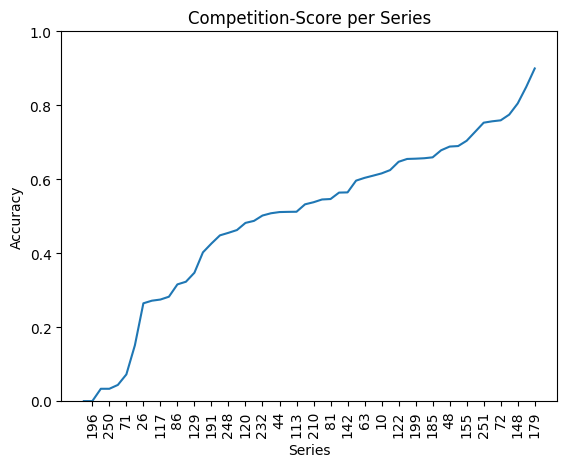

In [17]:
ax = scores.groupby('series_id')['score'].mean().sort_values().plot(
    ylim=(0, 1), title='Competition-Score per Series'
)
ax.set_ylabel("Accuracy")
ax.set_xlabel("Series")
ax.set_xticks(ticks=[*range(1, len(scores), 2)], labels=scores.series_id[::2], rotation=90)

fig = ax.get_figure()
fig.savefig("accuracy-per-series.png", bbox_inches="tight")

In [18]:
scores

,series_id,score,true_size
39,196,0.000000,2
17,94,0.000000,2
48,250,0.033333,6
35,187,0.033333,6
12,71,0.043750,40
50,267,0.072189,24
5,26,0.150809,8
31,171,0.264595,26
21,117,0.271667,10
15,83,0.274759,36


## Daten visualisieren

In [19]:
participant_series_id = 71
participant_series = predictions[predictions.series_id == str(participant_series_id)]
participant_series = participant_series[0:100_000]

participant_events = predicted_events[predicted_events.series_id == participant_series_id]
participant_events = participant_events[0:12]

participant_true_events = validation_events[validation_events.series_id == participant_series_id]
participant_true_events = participant_true_events[0:12]

In [20]:
participant_series

,step,num_series_id,awake,prediction_class,prediction_confidence_0,prediction_confidence_1,series_id,correct_prediction
3986611,0,71,1,1,0.000041,0.999959,71,1
3986612,1,71,1,1,0.000039,0.999961,71,1
3986613,2,71,1,1,0.000037,0.999963,71,1
3986614,3,71,1,1,0.000035,0.999965,71,1
3986615,4,71,1,1,0.000034,0.999967,71,1
...,...,...,...,...,...,...,...,...
4086606,99995,71,0,1,0.000002,0.999998,71,0
4086607,99996,71,0,1,0.000002,0.999998,71,0
4086608,99997,71,0,1,0.000002,0.999998,71,0
4086609,99998,71,0,1,0.000002,0.999998,71,0


In [21]:
participant_true_events

,series_id,night,event,step,timestamp,num_series_id
572,71,1,onset,6972.0,2019-02-20T21:26:00-0500,71
573,71,1,wakeup,13680.0,2019-02-21T06:45:00-0500,71
574,71,2,onset,24828.0,2019-02-21T22:14:00-0500,71
575,71,2,wakeup,30996.0,2019-02-22T06:48:00-0500,71
576,71,3,onset,43776.0,2019-02-23T00:33:00-0500,71
577,71,3,wakeup,48456.0,2019-02-23T07:03:00-0500,71
578,71,4,onset,60996.0,2019-02-24T00:28:00-0500,71
579,71,4,wakeup,65472.0,2019-02-24T06:41:00-0500,71
580,71,5,onset,78924.0,2019-02-25T01:22:00-0500,71
581,71,5,wakeup,83208.0,2019-02-25T07:19:00-0500,71


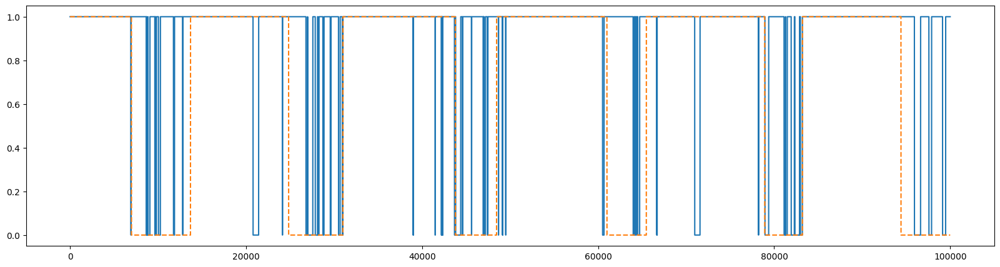

In [22]:
fig, ax = plt.subplots(figsize=(20, 5))
plt.plot(participant_series['step'], participant_series['prediction_class'])
plt.plot(participant_series['step'], participant_series['awake'], linestyle='dashed')
plt.show()

In [23]:
fig = px.line(participant_series, x='step', y='prediction_confidence_1', title=f'Schlafdaten für {participant_series_id}')
for index, row in participant_events.dropna().iterrows():
    color = 'orange' if row.event == 'onset' else 'red' 
    fig.add_vline(x=row.step, line_width=1, line_dash='dash', line_color=color)
    
for index, row in participant_true_events.dropna().iterrows():
    color = 'orange' if row.event == 'onset' else 'red' 
    fig.add_vline(x=row.step, line_width=1, line_color=color)

#Custom Legend
fig.add_trace(
    go.Scatter(
        x=[None],
        y=[None],
        line=dict(color='orange', width=2, dash='dash'),
        name="onset event",
    )
)
fig.add_trace(
    go.Scatter(
        x=[None],
        y=[None],
        line=dict(color='red', width=2, dash='dash'),
        name="wakeup event",
    )
)
fig.update_layout(legend_title="Events")
    
fig.show()

## Analysis for different thresholds

In [24]:
base_tolerances = [12, 36, 60, 90, 120, 150, 180, 240, 300, 360]

column_names = {
    'series_id_column_name': 'series_id',
    'time_column_name': 'step',
    'event_column_name': 'event',
    'score_column_name': 'score',
}

In [25]:
validation_events = validation_events[validation_events.step.notnull()]
validation_events

,series_id,night,event,step,timestamp,num_series_id
0,7,1,onset,7872.0,2018-08-22T23:11:00-0400,7
1,7,1,wakeup,14484.0,2018-08-23T08:22:00-0400,7
6,7,4,onset,60720.0,2018-08-26T00:35:00-0400,7
7,7,4,wakeup,68400.0,2018-08-26T11:15:00-0400,7
8,7,5,onset,77304.0,2018-08-26T23:37:00-0400,7
...,...,...,...,...,...,...
2955,276,33,wakeup,565824.0,2019-04-28T06:52:00-0400,276
2956,276,34,onset,577344.0,2019-04-28T22:52:00-0400,276
2957,276,34,wakeup,584052.0,2019-04-29T08:11:00-0400,276
2958,276,35,onset,595344.0,2019-04-29T23:52:00-0400,276


In [26]:
competition_score(validation_events, predicted_events)

0.4739971196968508

In [27]:
from scoring.event_detection_ap import score as manual_score

In [28]:
comp_scores = []
for i in range(0, 10):
    tolerances = {
        'onset': base_tolerances[:i+1],
        'wakeup': base_tolerances[:i+1],
    }
    comp_scores.append(manual_score(validation_events, predicted_events, tolerances, **column_names))
    print(f'Competition-Score for tolerances {base_tolerances[:i+1]}: {comp_scores[-1]}')

Competition-Score for tolerances [12]: 0.0141187247356697
Competition-Score for tolerances [12, 36]: 0.07534886662394057
Competition-Score for tolerances [12, 36, 60]: 0.14095898776051285
Competition-Score for tolerances [12, 36, 60, 90]: 0.20811537881487893
Competition-Score for tolerances [12, 36, 60, 90, 120]: 0.2698964181978908
Competition-Score for tolerances [12, 36, 60, 90, 120, 150]: 0.3220679677896211
Competition-Score for tolerances [12, 36, 60, 90, 120, 150, 180]: 0.36600067247066725
Competition-Score for tolerances [12, 36, 60, 90, 120, 150, 180, 240]: 0.4072394159434024
Competition-Score for tolerances [12, 36, 60, 90, 120, 150, 180, 240, 300]: 0.4428446825753981
Competition-Score for tolerances [12, 36, 60, 90, 120, 150, 180, 240, 300, 360]: 0.4739971196968508


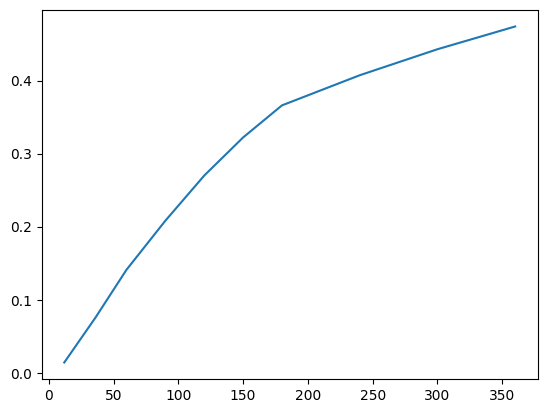

In [29]:
plt.plot(base_tolerances, comp_scores)

In [30]:
single_comp_scores = []
for i in range(0, 10):
    tolerances = {
        'onset': base_tolerances[i:i+1],
        'wakeup': base_tolerances[i:i+1],
    }
    single_comp_scores.append(manual_score(validation_events, predicted_events, tolerances, **column_names))
    print(f'Competition-Score for tolerance {base_tolerances[i:i+1]}: {single_comp_scores[-1]}')

Competition-Score for tolerance [12]: 0.0141187247356697
Competition-Score for tolerance [36]: 0.13657900851221144
Competition-Score for tolerance [60]: 0.2721792300336574
Competition-Score for tolerance [90]: 0.4095845519779773
Competition-Score for tolerance [120]: 0.5170205757299379
Competition-Score for tolerance [150]: 0.5829257157482727
Competition-Score for tolerance [180]: 0.6295969005569446
Competition-Score for tolerance [240]: 0.695910620252548
Competition-Score for tolerance [300]: 0.7276868156313638
Competition-Score for tolerance [360]: 0.7543690537899257


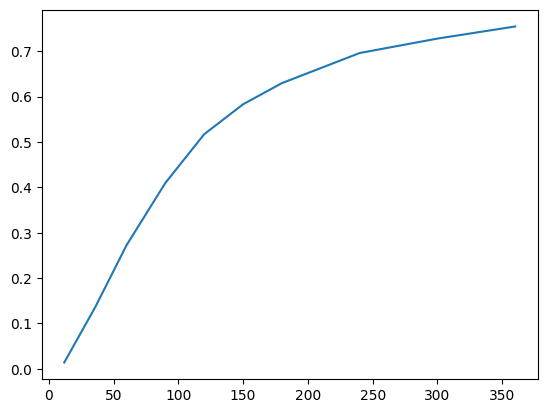

In [31]:
plt.plot(base_tolerances, single_comp_scores)

## Event Accuracy

In [32]:
def annotate_closest_events(predicted_events, true_events):

    for i, row in tqdm(predicted_events.iterrows()):
        series = true_events[(true_events.series_id == row.series_id) & (true_events.event == row.event)]
        predicted_step = row.step
        closest_index = (series['step'] - predicted_step).abs().idxmin()

        closest_step = true_events.loc[closest_index, 'step']
    
        # Set the 'closest' column to 1 for the row with the closest value
        predicted_events.loc[i, 'difference'] = abs(predicted_step - closest_step)

    return predicted_events

In [33]:
predicted_events = annotate_closest_events(predicted_events, validation_events)

2312it [00:01, 1699.22it/s]


In [34]:
events = predicted_events[predicted_events.difference < 360]
print(f'There are {len(events)} of {len(predicted_events)} Events that are inside the 30 Minute threshold ({(len(events) / len(predicted_events) * 100):.2f}%)')

events = predicted_events[predicted_events.difference >= 360]
print(f'There are {len(events)} of {len(predicted_events)} Events that are outside the 30 Minute threshold ({(len(events) / len(predicted_events) * 100):.2f}%)')

There are 1543 of 2312 Events that are inside the 30 Minute threshold (66.74%)
There are 769 of 2312 Events that are outside the 30 Minute threshold (33.26%)


In [35]:
for i in range(1, 6):
    events = predicted_events[predicted_events.difference > i*12*60*24]
    print(f'There are {len(events)} Events that are at least {i} days off the closest true event')

There are 189 Events that are at least 1 days off the closest true event
There are 129 Events that are at least 2 days off the closest true event
There are 106 Events that are at least 3 days off the closest true event
There are 102 Events that are at least 4 days off the closest true event
There are 91 Events that are at least 5 days off the closest true event


In [36]:
previous_event_size = 0
previous_tolerance = 0
events_in_threshold = len(predicted_events[predicted_events.difference < 360])
num_events = []
for tolerance in base_tolerances:
    events = predicted_events[predicted_events.difference < tolerance]
    num_events.append(len(events) - previous_event_size)
    print(f'There are {len(events) - previous_event_size} Events that are between {previous_tolerance / 12} - {tolerance / 12} Minutes of the closest true event ({((len(events) - previous_event_size) / events_in_threshold * 100):.2f}%)')
    previous_event_size = len(events)
    previous_tolerance = tolerance

There are 197 Events that are between 0.0 - 1.0 Minutes of the closest true event (12.77%)
There are 415 Events that are between 1.0 - 3.0 Minutes of the closest true event (26.90%)
There are 281 Events that are between 3.0 - 5.0 Minutes of the closest true event (18.21%)
There are 221 Events that are between 5.0 - 7.5 Minutes of the closest true event (14.32%)
There are 140 Events that are between 7.5 - 10.0 Minutes of the closest true event (9.07%)
There are 83 Events that are between 10.0 - 12.5 Minutes of the closest true event (5.38%)
There are 59 Events that are between 12.5 - 15.0 Minutes of the closest true event (3.82%)
There are 78 Events that are between 15.0 - 20.0 Minutes of the closest true event (5.06%)
There are 38 Events that are between 20.0 - 25.0 Minutes of the closest true event (2.46%)
There are 31 Events that are between 25.0 - 30.0 Minutes of the closest true event (2.01%)


In [57]:
previous_tolerance = 0
str_tolerances = []
for tolerance in base_tolerances:
    str_tolerances.append(f'{previous_tolerance / 12} - {tolerance / 12} Min')
    previous_tolerance = tolerance

In [58]:
str_tolerances

['0.0 - 1.0 Min',
 '1.0 - 3.0 Min',
 '3.0 - 5.0 Min',
 '5.0 - 7.5 Min',
 '7.5 - 10.0 Min',
 '10.0 - 12.5 Min',
 '12.5 - 15.0 Min',
 '15.0 - 20.0 Min',
 '20.0 - 25.0 Min',
 '25.0 - 30.0 Min']

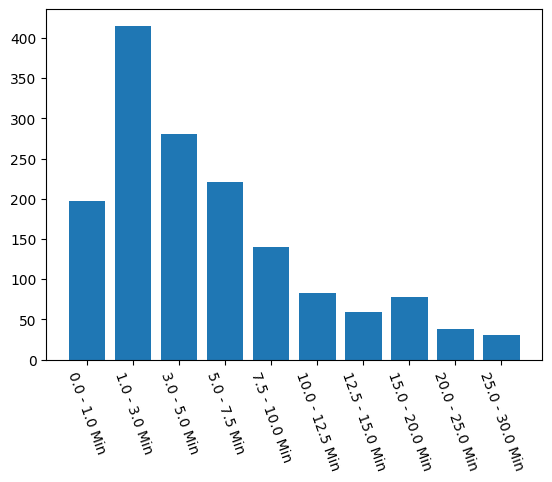

In [65]:
plt.xticks(rotation=-70)
plt.bar(str_tolerances, num_events, align='center')
plt.subplots_adjust(bottom=0.3)

plt.savefig('tolerances.png')